# Lab Assignment Two: Exploring Image Data 

***Michael Han, Andrew Kozelsky, Vince Miller, Ryan Cole***

## Business Understanding 
The dataset selected consists of 12,899 images. The images were collected by Andrzej Matiolanksi, Aleksandra Maksimowa, and Andrzej Dziech at AGH University for use in their publication CCTV (surveilance camera) object detection with fuzzy classification and image enhancement. The publication describes the dataset; "The dataset for knife detection was obtained from CCTV recordings. The images were cropped from the original frames using the sliding window method. The window size W × H was intentionally set to 100 × 100 pixels each". The dataset contains 9,340 images that are 100 x 100 pixels containing an image of a  knife. The dataset also contains 3,559 100 x 100 pixel images that do not contain a  knife. The publication states that the sliding window was applied to frames of the CCTV recordings to create the images containing a knife, but the publication did not state how the 100 x 100 pixels were selected from the images without knives. The focus of the publication was the possibilty of classifying images from CCTV quality recordings. While the publication had positive results related to classification on "fuzzy images"  we would like to note the possibilty of non reproduceable results on other CCTV systems when using their or our algorithm based on how the images were collected.

Our goal is the same as the research team at AGH university. Classify images based on a knife in the image or not. Our team did not investigate the video recordings, and does not plan to convert recordings into images, but instead begin after the images desribed above were created. The type of image classification that aims to prevent disatrous events no doubt will recieve attention because of the potential to increase public safety. Camera surveilance is currently used to protect our citizens in many places, but due to low transfer rate of video feed to the human brain the task becomes overwhelming as the quantity of video feeds increases. An algorithm that can notify authority based on high risk situations e.g. a knife in the image, could increase the efficiency of video surveilance programs. An increase in efficiency means faster response time, and an increased chance of preventing a disatrous event.

The research team points out the potential hazard of too many false positives. A system that repeatedly notfiys authority of a potential event that does not actually exist would be useless for the purpose of increasing efficiency. Resources wasted on false positive investigations could cause a secutrity team to be ill prepared during an actual event. Similar to the research team our algorithmn will sacrifice sensitivity for specifity. For example if our team was contracted to provide our algorithmn for use at a sporting event with 50,000 people in attendance, assuming each individual is seen on camera once, a false positive rate of .01% would lead to 5 false positive investigations. This seems acceptable given the scenario. An algorithmn that consistently notifies authority of true positives related to high risk events has great value, and our project aims to complete this task for the selected dataset.

Source: http://www.mdpi.com/1424-8220/16/1/47/htm

### Data Preperation

In [1]:
import os
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# Separated Images with Knives and Without based on folders
neg = [cv2.imread(file) for file in glob.glob(r"C:\Users\mhan\Documents\GradSchool\Projects\Machine-Learning-Group\lab2\KnivesImagesDatabase\NEGATIVES_ALL\*.bmp")]
pos = [cv2.imread(file) for file in glob.glob(r"C:\Users\mhan\Documents\GradSchool\Projects\Machine-Learning-Group\lab2\KnivesImagesDatabase\POSITIVES_ALL\*.bmp")]

# above returns a list - converting to numpy array and combining
neg = np.asarray(neg)
pos = np.asarray(pos)

In [3]:
# Function to Convert Images into Grayscale
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

In [4]:
# Empty list to store new grayscale images
neg_gray = []
pos_gray = []
for i in range(0,neg.shape[0]):
    neg_gray.append(rgb2gray(neg[i]))

for n in range(0,pos.shape[0]):
    pos_gray.append(rgb2gray(pos[n]))

# force list into array
neg_gray = np.asarray(neg_gray)
pos_gray = np.asarray(pos_gray)

### Flatten grayscale images into a 1-Dimensional Array

 We converted the images from RGB values to grayscale in order to reduce the amount of feature vectors from 300,000 to 100,000. The image visualization plot shows examples of images with and without and knife.  We assigned a dummy variable with '0' flagging images without knives and '1' for images with knives. After flagging pictures to the correct classification, both classes were appended into one complete array.

In [5]:
# Flatten Images w/o knives
numImages_neg = neg_gray.shape[0]
flat_neg = np.array([neg_gray[i].flatten() for i in range(0,numImages_neg)])

# "0" flag for no knife
flat_neg = np.append(flat_neg,np.zeros([len(flat_neg),1]),1)

# Flatten images w/ knives
numImages_pos = pos_gray.shape[0]
flat_pos = np.array([pos_gray[i].flatten() for i in range(0,numImages_pos)])

# "1" flag with knife
flat_pos = np.append(flat_pos,np.ones([len(flat_pos),1]),1)


In [6]:
# combining numpy arrays into one
db = np.append(flat_pos, flat_neg, axis = 0)

print("1-D Representation of images with Binary Flagging of Knife Present: ", db.shape)

1-D Representation of images with Binary Flagging of Knife Present:  (12899, 10001)


### Image Visualization of the 'Knife' or 'No Knife' Dataset


In [11]:
# Our Target Variable
y = db[:,-1]
y = y.astype('int') # forced array column to Integer for Name assignment

# Our data
X = db[:,:-1]

# Dataset specifics
n_image, n_attrib = X.shape
_, h_neg, w_neg, rgb_neg = neg.shape # clearly detailing that both class of images are 100 x 100
_, h_pos, w_pos, rgb_pos = pos.shape
n_classes = 2
names = np.array(['No Knife', 'Knife'])

# declaring h and w for ease of reference 
_, h, w, rgb = neg.shape

# Printing out Data Specs
print('Information About Our Dataset')
print('=============================')
print('Images Dimension of Negatives: {} x {} '.format(h_neg, w_neg))
print('Images Dimension of Positives: {} x {}'.format(h_pos, w_pos))
print('Total images without Knives: {}'.format(flat_neg.shape[0]))
print('Total images with Knives: {}'.format(flat_pos.shape[0]))
print('Total Number of Images: {}'.format(n_image))
print('Feature Vectors after grayscale conversion: {}'.format(h*w))

Information About Our Dataset
Images Dimension of Negatives: 100 x 100 
Images Dimension of Positives: 100 x 100
Total images without Knives: 9340
Total images with Knives: 3559
Total Number of Images: 12899
Feature Vectors after grayscale conversion: 10000


The database was separated out into two classifications. "No Knife" and "Knife". All images are 100 X 100 pixels. 
Images with knives makes up ~27% of our dataset

IMAGE VISUALIZATION


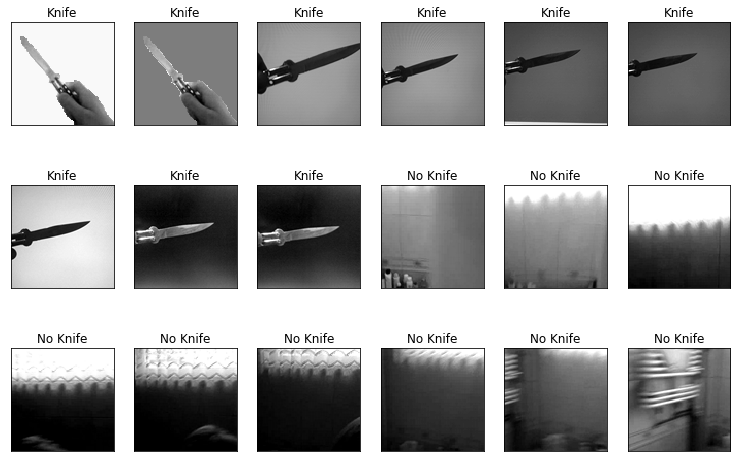

In [31]:
#Visualize the image data
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())


# Slicing the dataset so we can see both no knife and knife images
X_sample = X[3550:3600]
y_sample = y[3550:3600]
print('IMAGE VISUALIZATION')
print('===================')
plot_gallery(X_sample, names[y_sample], h, w)

The image visualization above displays a segment of our data of both classes and their respecitve classification, recreated within our environment.

## **Data Reduction**

### Linear PCA
We perform PCA on the data using linear dimensions. Because the data has 10,000 features, we hope to reduce the number of features so that we can compress and store this image data set, easing computational constraints and allowing one to analyze more data. 

In [11]:
#Linear dimension reduction
from sklearn.decomposition import PCA

n_components = 250
print ("Extracting the top %d eigenknives from %d knives" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenknives = pca.components_.reshape((n_components, h, w))

Extracting the top 250 eigenknives from 12899 knives
Wall time: 39 s


In [12]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_ # normalize eigenvalues
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

pca = PCA(n_components=250)
X_pca = pca.fit(X)
plot_explained_variance(pca)

We've decided to include 250 principal components in our model. 92% explained variance is the higest we can attain. The above plot shows there is a diminishing return for each additional principal componet beyond 250 components.

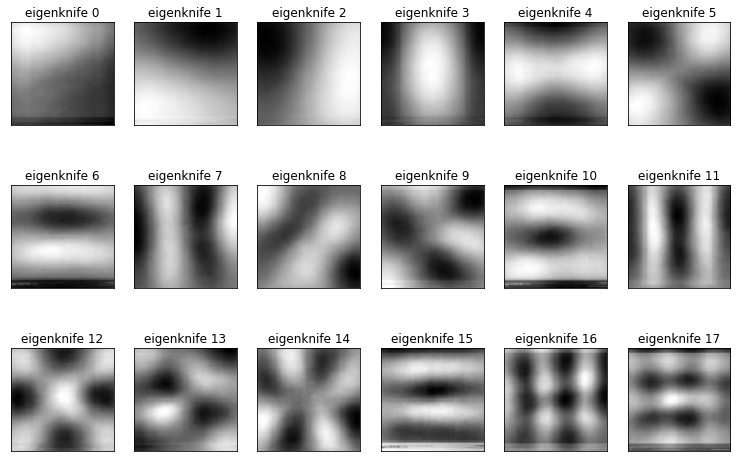

In [13]:
eigenknives_titles = ["eigenknife %d" % i for i in range(eigenknives.shape[0])]
plot_gallery(eigenknives, eigenknives_titles, h, w)

Above are the top eigenvectors that explain the largest amount of variance in our dataset. There does not seem to be a clear representation about a knife based on the 'eigenknives'. It is hard to decern the general location of the knife based on the eigenvectors. 

## Randomized PCA
Full PCA can be computationally demanding, and so we use randomized PCA, which randomly samples from the data set and projects in order to construct an approximation to the full covariance matrix. This approach leaves us with a lower rank matrix that is a good approximation of the full covariance matrix. 

In [14]:
n_components = 250
print ("Extracting the top %d eigenknives from %d knives" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components,svd_solver='randomized')
%time rpca.fit(X.copy())
eigenknives = rpca.components_.reshape((n_components, h, w))

plot_explained_variance(rpca)

Extracting the top 250 eigenknives from 12899 knives
Wall time: 26.7 s


Again the same issue occurs as before. The additional componenet beyond 250 yeilds diminishing returns. We found that 250 components for the randomized PCA is sufficient with 92% variance explained.

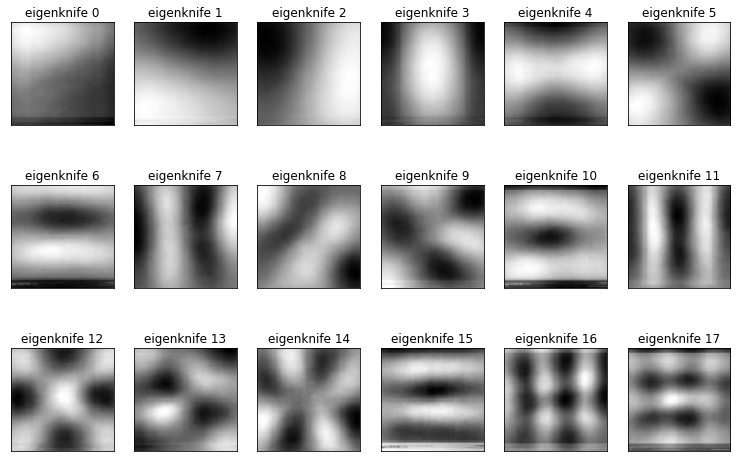

In [15]:
eigenknife_titles = ["eigenknife %d" % i for i in range(eigenknives.shape[0])]
plot_gallery(eigenknives, eigenknife_titles, h, w)

As expected, we see the same 'eigenknives' from the Full PCA in the randomized PCA. However, the randomized PCA does perform more quickly.

In [19]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image

idx_to_reconstruct = 10    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

## Kernel PCA
We then perform PCA on the data using non-linear dimensions. The hope here is that this PCA will allow for more accurate reconstruction of the data by using non-linear dimensions. 

In [16]:
# Kernel PCA
from sklearn.decomposition import KernelPCA

n_components = 250
print ("Extracting the top %d eigenknives from %d knives calculating inverse transform" % (n_components, X.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X)

Extracting the top 250 eigenknives from 12899 knives calculating inverse transform


KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=12, kernel='rbf',
     kernel_params=None, max_iter=None, n_components=250, n_jobs=1,
     random_state=None, remove_zero_eig=True, tol=0)

## Compare Reconstructed Images
We wish to asses which PCA method allows for the best reconstruction of the data. While the images below suggest that kernel PCA is superior to the other methods in capturing some of the finer details of this particular image, we must quanititatively assess which method is able to reconstruct the images most accurately. 

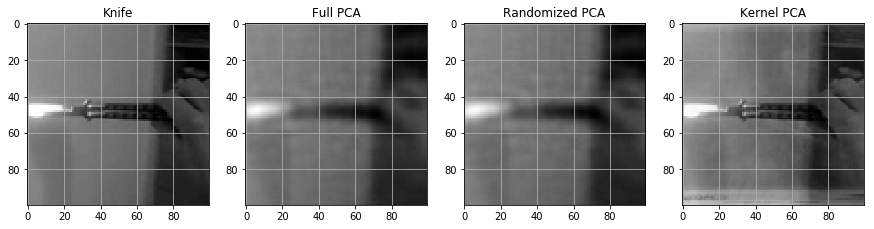

In [17]:
def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title(names[y[idx_to_reconstruct]])
    plt.grid()
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.grid()
    
    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Randomized PCA')
    plt.grid()
    
    plt.subplot(1,4,4)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.grid()
    
    
plt_reconstruct(10)

## Comparing PCA Methods
We then compare the PCA results, one with linear dimensions and the other with non-linear dimensions, using the structural similarity index. Mean squared error is generally not a good indicator of the similarity between images. Structural similarity, on the other hand, overcomes this issue by taking the textures of images into account. As the ssim function takes a bit to compare the structural similarites of two images, we will be using a random sample of size 500 from our data and computing the structural similarities between the original image and the final image, reconstructed using each method of PCA. The results are stored in a list and then the mean of this list is computed, giving us an estimate of the average SSI for the entire set of images. The results are printed below. 

In [18]:
from skimage import data, img_as_float
from skimage.measure import compare_ssim as ssim

### Kernel PCA

In [20]:
indices = np.random.randint(0,X.shape[0],500)
kpca_ssi = []

for i in X[indices]:
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(i.reshape(1, -1)))
    original_image = i
    kpca_ssi.append(ssim(reconstructed_image_kpca.reshape((h,w)),original_image.reshape((h,w))))
    
kpca_ssi_avg = np.mean(kpca_ssi)

### Full PCA

In [23]:
#Get structural similarity indices for the pca
#First we sample the images, as computing it on the entire data set may take a while
indices = np.random.randint(0,X.shape[0],500)
pca_ssi = []

for i in X[indices]:
    reconstructed_image = pca.inverse_transform(pca.transform(i.reshape(1, -1)))
    original_image = i
    pca_ssi.append(ssim(reconstructed_image.reshape((h,w)),original_image.reshape((h,w))))
    
pca_ssi_avg = np.mean(pca_ssi)

### Random PCA

In [22]:
#Get structural similarity indices for the rpca 
indices = np.random.randint(0,X.shape[0],500)
rpca_ssi = []

for i in X[indices]:
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(i.reshape(1, -1)))
    original_image = i
    rpca_ssi.append(ssim(reconstructed_image_rpca.reshape((h,w)),original_image.reshape((h,w))))
    
rpca_ssi_avg = np.mean(rpca_ssi)

### Results

Text(0.5,1,'Boxplot of PCA Methods')

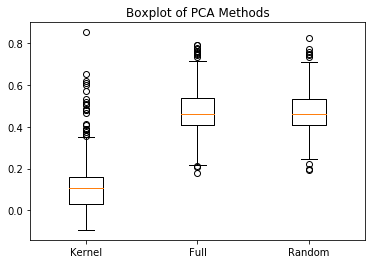

In [46]:
plt.boxplot([kpca_ssi,pca_ssi,rpca_ssi], labels=['Kernel','Full', 'Random'])
plt.title('Boxplot of PCA Methods')

Full PCA and Random PCA are both have a better representation of what the original image in our dataset. Although there are some cases where Kernel PCA performs better than the other PCA. There does not seem to be a large difference between Full or Random PCA. 

In [24]:
print('Kernel PCA:',kpca_ssi_avg)
print('Random PCA:',rpca_ssi_avg)
print('Full PCA:',pca_ssi_avg)

Kernel PCA: 0.11780593610112794
Random PCA: 0.4702166763582421
Full PCA: 0.4740219652064659


Each PCA analysis used 250 components. Based on these results, it appears that the randomized PCA is nearly as good as the full PCA at capturing the images. Randomized PCA offers the advantage of faster computation, and so we feel that randomized PCA is, in this case, a better method. 

# Daisy Feature Extraction

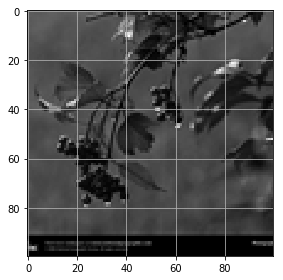

In [32]:
from skimage.io import imshow

idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
img = img/img.max()
imshow(img)
plt.grid()

Images in our dataset had a low contrast range. Matplotlib converted the image to a Green Blue Yellow coloring, so for the image we divided the image by the maximal pixel value to convert the image back into grayscale

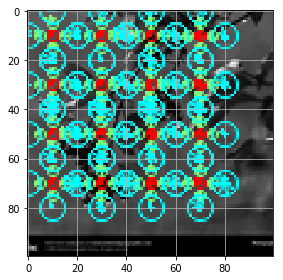

In [70]:
from skimage.feature import daisy

# lets first visualize what the daisy descripto looks like
features, img_desc = daisy(img,step=20, radius=10, rings=2, histograms=4, orientations=10, visualize=True)
imshow(img_desc)
plt.grid()

Daisy parameters selected to reduce the number of features down from 10,000 to 1760 based on gradient orientation histograms. Producing the bag-of-features.

In [69]:
features = daisy(img,step=20, radius=10, rings=2, histograms=5, orientations=10, visualize=False)

print('Daisy Features and Shape:')
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

Daisy Features and Shape:
(4, 4, 110)
1760


In [55]:
# Daisy function to be applied to entire dataset
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=20, radius=10, rings=2, histograms=5, orientations=10, visualize=False)
    return feat.reshape((-1))

In [56]:
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))

print(daisy_features.shape) # Print daisy features shape confirming function applied to dataset

Wall time: 5min 37s
(12899, 1760)


In [58]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

Wall time: 12.8 s


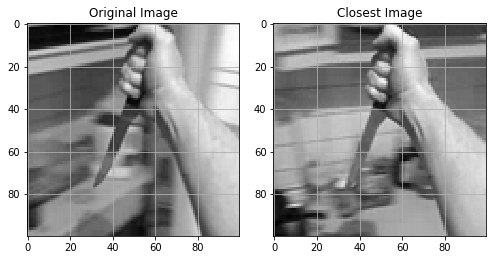

In [71]:
import copy
# find closest image to current image
idx1 = 100
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)) / X[idx1].max())
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)) / X[idx1].max())
plt.title("Closest Image")
plt.grid()

Our dataset contains multiple images that are slightly different from one another, such as, a change is orientation or a change of backgroud. All the 'Knife' images are captured in first person and in the middle of the images.

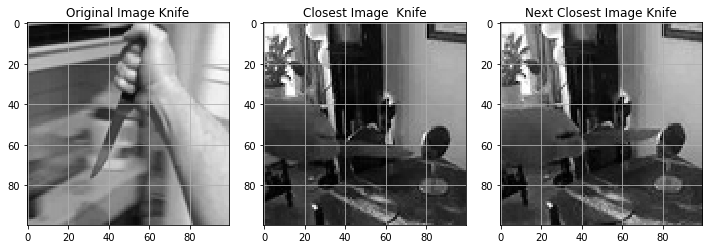

In [80]:
distances = copy.deepcopy(dist_matrix[1334,:]) # get all image diatances
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

distances[idx2] = np.infty
idx3 = np.argmin(distances)

plt.figure(figsize=(10,16))
plt.subplot(1,3,1)
imshow(X[idx1].reshape((h,w)) / X[idx1].max())
plt.title("Original Image "+names[y[idx1]])
plt.grid()

plt.subplot(1,3,2)
imshow(X[idx2].reshape((h,w)) / X[idx2].max())
plt.title("Closest Image  "+names[y[idx2]])
plt.grid()

plt.subplot(1,3,3)
imshow(X[idx3].reshape((h,w)) / X[idx3].max())
plt.title("Next Closest Image "+names[y[idx3]])
plt.grid()


The daisy method does confirm some images with knives are related to images with knives and vice versa. However with our dataset, there were multiple images of knives in the same room with minimal differences which may skew our results, for example idx1 = 100. There are also some instances where the original image is classified as having a knife but the related images have no knives. The KNN and visualizations will help us determine how accurate the daisy method is on our dataset.


## Visualizing Feature Extraction
A visual inspection intended to understand if the daisy feature extraction method will be successfull at image classification

In [73]:
# array of pairwise dist for knife and no knife photos
pw_dist_knife_noknife = dist_matrix[0:3559:1,3559::1].ravel()
# array of pairwise dist for knife photos
pw_dist_knife = dist_matrix[np.triu_indices(3559, 1)]
# array of pairwise dist for noknife photos
pw_dist_noknife = dist_matrix[3559::1,3559::1][np.triu_indices(9340,1)]

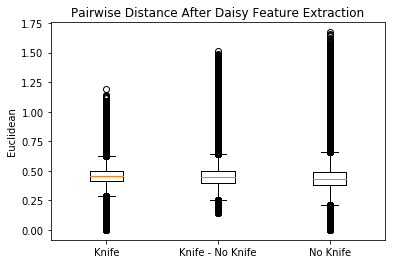

The respective medians:  [0.45614207654282385, 0.4451233210891325, 0.43242410759265665]


In [74]:
# create boxplot of pairwise dist arrays for comparison
plt.boxplot([pw_dist_knife,pw_dist_knife_noknife,pw_dist_noknife], labels=['Knife','Knife - No Knife', 'No Knife'])
plt.title('Pairwise Distance After Daisy Feature Extraction')
plt.ylabel('Euclidean')
plt.show()
print('The respective medians: ',[np.median(x) for x in [pw_dist_knife,pw_dist_knife_noknife,pw_dist_noknife]])


The box plot shown above was calculated using the distance matrix found after the daisy method was used for feature extraction. Once the 5760 daisy features were found a pairwise comparison using euclidean distance were found for each vector. Using this distance matrix a box plot was created for 3 groups. The 3 groups were the pairwise distance for images with a knife, images with a knife compared to images without a knife, and images that do not contain a knife.

The ideal case for the daisy method is that the images with a knife and without have a relatively low euclidean distance when compared to their respective class, and have relatively high euclidean distance when calculated across classes. This was not the case. A second, but less ideal case is that either the images with a knife or without a knife have a relatively low euclidean distance, and a relatively high euclidean distance when calculated across classes.

e.g. the images with a knife are extremely different, but the images without a knife are all extremely similar.

The given example would have relatively high euclidean distance for both the knife class as well as when calculated across classes, but the euclidean distance for the images without a knife would be relatively lower. Via inspection of the box plot above it appears that the daisy feature extraction method yields vectors with similar euclidean distance for images when the images are compared to their own class or across classes. This leads the group to believe DAISY feature extraction is not an ideal method for our dataset.

## K-Nearest Neighbors for Daisy Method

In [75]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(daisy_features, y, test_size = 0.20)

The grid search package from sklearn will iterate through the 'K' parmeters and select the parameter with the highest accuracy. We'll use the best parameter for 'n_neighbors' for the K-Nearest Neighbor Classification. We selected 3, 10, 15 for the nearest neighbor to get test small to large number of neighbors and not a range because of how computational taxing the process is. The process with three different 'n_neighbors' approximately takes an hour to complete.

In [76]:
%%time
k = 3,10,15
parameters = {'n_neighbors':k}
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier()
clf = GridSearchCV(knn, parameters, cv=3)
clf.fit(X_train, y_train)

Wall time: 40min 41s


In [77]:
clf.best_estimator_

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')

Based on the grid search and the pre-selected parameters, the optimal n_neighbors is 3

In [78]:
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X_train,y_train)
pred = knn.predict(X_test)
print(accuracy_score(y_test, pred))

0.7887596899224806


KNN classifier confirms the boxplot visualization results. The Daisy method was not able to accurately distinguish whether there was or was not a knife in the image. Images with knives only make up about 27% of our dataset. The daisy method accuracy, in essence, is the same as randomly choosing an image with a knife in our dataset.

## Gabor Kernels

The daisy method did not perform well with our dataset. So, we attempted to apply the Gabor method on our images. Below are the code and plots are to see if the Gabor method performs better than the Daisy method.

In [51]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(4):
    theta = theta / 4. * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))

In [48]:
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

Wall time: 12min 3s
(12899, 64)


The gabor method has a smaller bag-of-features for our images. 

In [49]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix_gabor = pairwise_distances(gabor_stats)

Wall time: 4.76 s


In [50]:
dist_matrix_gabor.shape # pairwise distance matrix between images using Gabor feature extraction

(12899, 12899)


## Visualizing Feature Extraction
A visual inspection intended to understand if the gabor feature extraction method will be successfull at image classification

In [52]:
# array of pairwise dist for knife and no knife photos
pw_dist_knife_noknife = dist_matrix_gabor[0:3559:1,3559::1].ravel()
# array of pairwise dist for knife photos
pw_dist_knife = dist_matrix_gabor[np.triu_indices(3559, 1)]
# array of pairwise dist for noknife photos
pw_dist_noknife = dist_matrix_gabor[3559::1,3559::1][np.triu_indices(9340,1)]

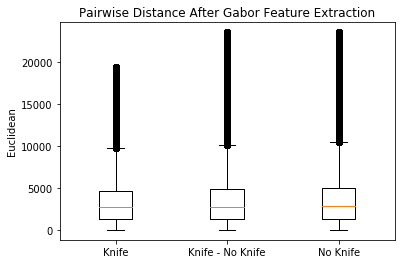

The respective medians:  [2732.5700141986404, 2795.0472401337656, 2823.7791804627095]


In [53]:
# create boxplot of pairwise dist arrays for comparison
plt.boxplot([pw_dist_knife,pw_dist_knife_noknife,pw_dist_noknife], labels=['Knife','Knife - No Knife', 'No Knife'])
plt.title('Pairwise Distance After Gabor Feature Extraction')
plt.ylabel('Euclidean')
plt.show()
print('The respective medians: ',[np.median(x) for x in [pw_dist_knife,pw_dist_knife_noknife,pw_dist_noknife]])


Following the same logic that was used for understanding the daisy feature extraction boxplots it appears that gabor feature extraction will not perform well.

## K-Nearest Neighbors for Gabor Method

In [56]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(gabor_stats, y, test_size = 0.20)

In [57]:
%%time
k = 3,10,15
parameters = {'n_neighbors':k}
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier()
clf = GridSearchCV(knn, parameters, cv=3)
clf.fit(X_train, y_train)

Wall time: 6.42 s


In [58]:
clf.best_estimator_

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=10, p=2,
           weights='uniform')

Based off of the grid search and pre-selected parameters, the most optimal n_neighbors would be 10

In [60]:
knn = KNeighborsClassifier(n_neighbors = 10)
knn.fit(X_train, y_train)
pred = knn.predict(X_test)
print(accuracy_score(y_test, pred))

0.7178294573643411


Same logic again as the Daisy method. The Gabor method is also not a sufficient method to predict whether the image contains a knife.

### Exceptional Work
We use the Oriented FAST and BRIEF (ORB) local feature detector, presented by [Rublee et al.](https://en.wikipedia.org/wiki/Oriented_FAST_and_rotated_BRIEF#cite_note-Rublee2011-1) to detect features, or keypoints, within images.  Keypoints are then compared using a nearest neighbor classifier, and keypoints pairs are selected if they satisy the criteria used by Lowe in ["Distinctive Image Features from Scale-Invariant Keypoints"](https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf).

ORB builds on the FAST keypoint detector, which detects corners by looking for locally contiguous pixels that have a higher or lower intensity than a candidate pixel.  Locations identified as keypoints are described using a BRIEF descriptor that builds a descriptor from the pixels in the image instead of using PCA or such to reduce the dimensionality.

Every descriptor in the query image is then compared to the descriptors for keypoints in the second image, and a distance is computed for the two nearest matches.  Using the criterion suggested by Lowe, we estimate that if the distances between the keypoint in the query image and the first and second nearest matches are similiar, it is likely that we have not found a true matching feature.  Using this criteria, we select the 'good' matches between two images.

In [14]:
# use K Nearest Neighbors comparison to compare keypoints between images
def find_matching_keypairs(des1, des2, lowe_ratio=0.8):
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)

    # Match descriptors.
    # See Lowe, https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf
    # "We can think of the second-closest match as providing an estimate of the density of 
    #  false matches within this portion of the feature space and at the same time 
    #  identifying specific instances of feature ambiguity."
    #
    # returns distances for nearest and 2nd nearest matches.  If 2nd nearest close, assume 
    # there are many that are close and that the 'match' is poor. 
    if des1 is not None and des2 is not None:
        # find the two 'best' matches between the sets for each element in set 1
        matches = bf.knnMatch(des1,des2, k=2)
        # keep only good matches
        try:
            good_matches = [(i[0],i[1]) for i in matches if i[0].distance < i[1].distance * lowe_ratio]
        # if only one keypoint then can't find two best matches
        except:
            good_matches = []

    else: 
        good_matches = []
        
    return good_matches

#compare two images
def orb_compare_pair(img1, img2, orb_params, lowe_ratio = 0.8, show_plots=False):
    # first image
    # Initiate ORB detector
    orb = cv2.ORB_create(**orb_params)
    # find the keypoints with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    
    # plot image and keypoints
    if show_plots:
        fig, (ax1,ax2) = plt.subplots(1,2)
        ax1.imshow(img1, cmap='Greys_r')
        img1b = cv2.drawKeypoints(img1, kp1, None, color=(0,255,0), flags=0)
        ax2.imshow(img1b)
        plt.show()
        
    
    # second image
    # Initiate ORB detector
    orb = cv2.ORB_create(**orb_params)
    # find the keypoints with ORB
    kp2, des2 = orb.detectAndCompute(img2,None)

    # plot image and keypoints
    if show_plots:
        fig, (ax1,ax2) = plt.subplots(1,2)
        ax1.imshow(img2, cmap='Greys_r')
        img2b = cv2.drawKeypoints(img2, kp2, None, color=(0,255,0), flags=0)
        ax2.imshow(img2b)
        plt.show()

    # use K Nearest Neighbors comparison to compare keypoints between images
    good_matches = find_matching_keypairs(des1, des2, lowe_ratio)

    # Draw matches.
    if show_plots:
        sorted_matches = sorted([i[0] for i in good_matches], key = lambda x :x.distance)
        img3 = cv2.drawMatches(img1,kp1,img2,kp2,sorted_matches, None, flags=2)
        plt.imshow(img3)
        plt.show()

        print('{0} matching keypoints between the two images, using lowe ratio of {1}'.format(str(len(good_matches)), lowe_ratio))
        
    return len(good_matches)
    
# compare all img1 to all images in img_vector, return vector of keypair matches
def orb_compare_n_pairs(img1, img_vect, orb_params, lowe_ratio = 0.8):

    results = [0 for i in range(len(img_vect))]
    
    # query image
    # Initiate ORB detector
    orb = cv2.ORB_create(**orb_params)
    # find the keypoints with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)

    # lets do this the bad way
    for i in range(len(img_vect)):
        # second image
        img2 = img_vect[i]
        if np.array_equal(img2,img1):
            results[i] = None
        else:
            # Initiate ORB detector
            orb = cv2.ORB_create(**orb_params)
            # find the keypoints with ORB
            kp2, des2 = orb.detectAndCompute(img2,None)       

            good_matches = find_matching_keypairs(des1, des2, lowe_ratio=0.8)
            if good_matches is not None:
                results[i] = len(good_matches)
            else:
                results[i] = None
    
    return(results)

We initially select a query image that contains the search image (knife) with a simple background.  Using ORB to determine the keypoints, we compare the simple query image to a similiar knife image with a simple background.

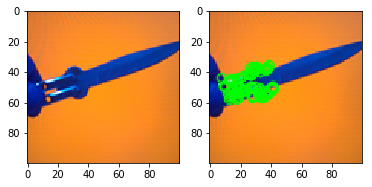

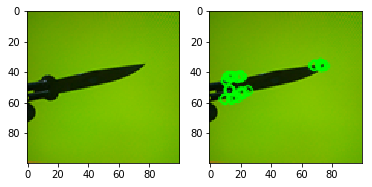

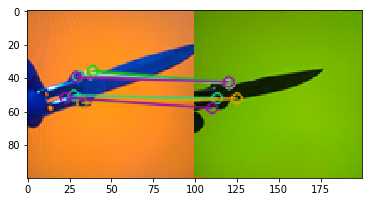

7 matching keypoints between the two images, using lowe ratio of 0.8


7

In [15]:
# compare two images and return number of matching keypoints:
orb_params = {'edgeThreshold': 8,
             }

lowe_ratio = 0.8

img1 = pos[3552]
img2 = pos[3556]
img3 = neg[3500]

orb_compare_pair(img1, img2, orb_params, lowe_ratio, show_plots=True)

The query image is compared to a visually similar image, using a reduced edge threshold.  This parameter is defined as the "size of the border where the features are not detected" in the OpenCV documentation for ORB, which is somewhat vague but appears to be a threshold on the quality of an observed edge.  The same term is used for the threshold when comparing gaussians in the SIFT algorithm.

Finding only 7 matching keypoints between two similar images is not promising.  ORB may not be the proper approach to use when the reference/query image is a simple object without distinctive texture.  Below, we compare the same query image to an unrelated image that does not contain a knife.

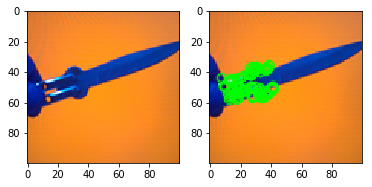

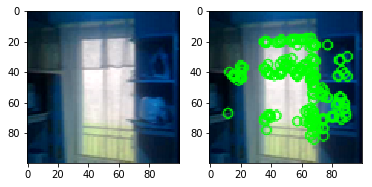

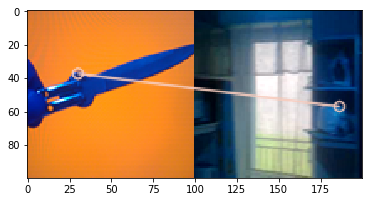

1 matching keypoints between the two images, using lowe ratio of 0.8


1

In [16]:
orb_compare_pair(img1, img3, orb_params, lowe_ratio, show_plots=True)

Comparing the query image to an unrelated image, we find 1 matching keypoint.  Again, this result is not promising, since we would like to be able to classify images based on the number of matching keypoints found.

In [18]:
%%time 
tuning_output = []

# tuning attempt
for i in [1.1, 1.2, 1.5]:
    for j in [8,16,24]:
        for k in [4,8,12]:
            orb_params = {'scaleFactor': i,
                          'edgeThreshold': j,
                          'nlevels': k,
                         }
            lowe_ratio = 0.8

            pos_kp_counts = orb_compare_n_pairs(img1, pos, orb_params, lowe_ratio)
            neg_kp_counts = orb_compare_n_pairs(img1, neg, orb_params, lowe_ratio)
            tuning_output.append([pos_kp_counts, neg_kp_counts, i, j, k])

Wall time: 11min 6s


In [19]:
tuning_output2 = [([0 if xi is None else xi for xi in x],y,i,j,k) for x,y,i,j,k in tuning_output]
tuning_output_df = [(x, y, np.mean(x), np.max(x), np.mean(y), max(y), i, j, k) for x,y,i,j,k in tuning_output2]

import pandas as pd

tuning_df = pd.DataFrame(tuning_output_df)
tuning_df.columns = ['pos_kp_counts', 'neg_kp_counts', 'pos_mean', 'pos_max', 'neg_mean', 'neg_max', 'scaleFactor', 'edgeThreshold', 'nlevels']
tuning_df['mean_ratio'] = tuning_df.pos_mean / tuning_df.neg_mean
tuning_df.drop(['pos_kp_counts','neg_kp_counts'], axis=1)

,pos_mean,pos_max,neg_mean,neg_max,scaleFactor,edgeThreshold,nlevels,mean_ratio
0,0.986232,60,1.038758,40,1.1,8,4,0.949434
1,1.364428,78,1.474946,49,1.1,8,8,0.925070
2,1.613656,88,1.700535,81,1.1,8,12,0.948910
3,0.781399,29,0.867452,33,1.1,16,4,0.900798
4,1.077550,41,1.182548,43,1.1,16,8,0.911210
5,1.115201,42,1.220985,46,1.1,16,12,0.913362
6,0.595954,19,0.632227,20,1.1,24,4,0.942627
7,0.651026,22,0.682013,21,1.1,24,8,0.954565
8,0.646249,22,0.682869,21,1.1,24,12,0.946373
9,1.312728,17,1.387580,53,1.2,8,4,0.946056


Attempting to tune ORB to refine the keypoint selection, we compare the selected query image to every image in the dataset.  

The mean_ratio parameter shows that more than half the time we find more matching keypoints when comparing the query image to an image without a knife, than when comparing to an image we know contains a knife.  Increasing the scaleFactor parameter improves the mean ratios marginally, but at the cost of the number of keypoints found.  Furthermore, only the first two tunings with a low scale factor result in a higher maximum number of matching keypoints in the 'has knife' imageset compared to the 'no knife' dataset.

The images with the highest number of matchings in the positive and negative set are shown below.

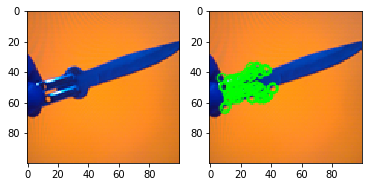

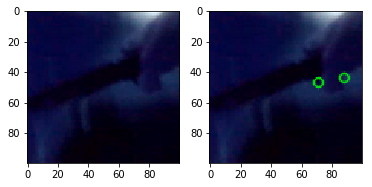

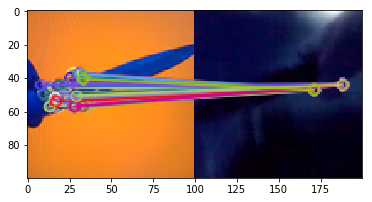

60 matching keypoints between the two images, using lowe ratio of 0.8


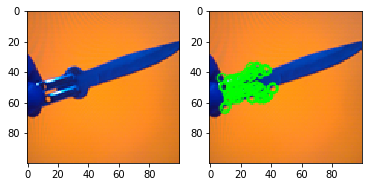

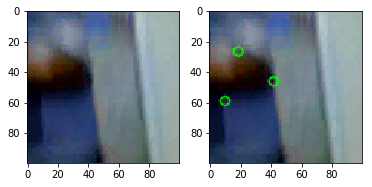

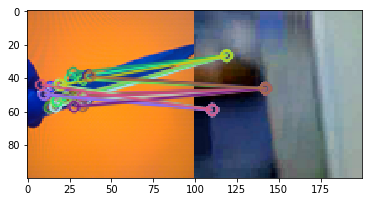

40 matching keypoints between the two images, using lowe ratio of 0.8


40

In [20]:
import operator

# results using default values
tuning_select = 0

pos_kp_counts = tuning_output2[tuning_select][0]
neg_kp_counts = tuning_output2[tuning_select][1]

pos_max_index, pos_max_value = max(enumerate(pos_kp_counts), key=operator.itemgetter(1))
neg_max_index, neg_max_value = max(enumerate(neg_kp_counts), key=operator.itemgetter(1))


orb_params = {'scaleFactor': tuning_output2[tuning_select][2],
              'edgeThreshold': tuning_output2[tuning_select][3],
              'nlevels': tuning_output2[tuning_select][4],
             }

orb_compare_pair(img1, pos[pos_max_index], orb_params, lowe_ratio, show_plots=True)
orb_compare_pair(img1, neg[neg_max_index], orb_params, lowe_ratio, show_plots=True)


The images above show that the image pairs where we observe the highest number of matches among the tunings iterated through are the results of lowering thresholds until any observed keypairs will match.

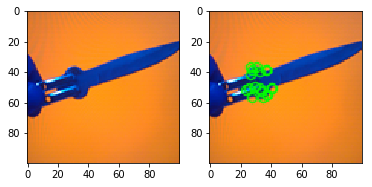

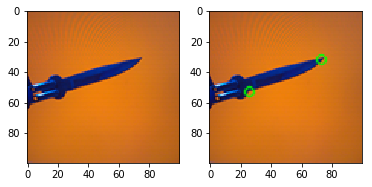

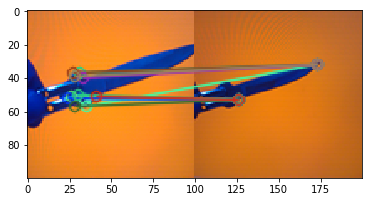

12 matching keypoints between the two images, using lowe ratio of 0.8


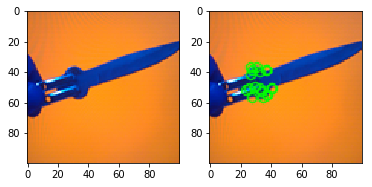

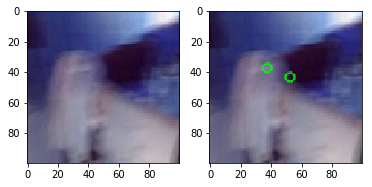

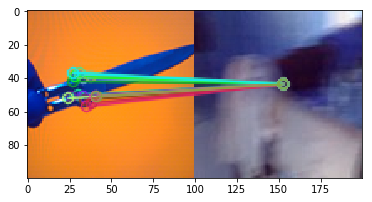

15 matching keypoints between the two images, using lowe ratio of 0.8


15

In [21]:
import operator

# results using default values
tuning_select = 26

pos_kp_counts = tuning_output2[tuning_select][0]
neg_kp_counts = tuning_output2[tuning_select][1]

pos_max_index, pos_max_value = max(enumerate(pos_kp_counts), key=operator.itemgetter(1))
neg_max_index, neg_max_value = max(enumerate(neg_kp_counts), key=operator.itemgetter(1))


orb_params = {'scaleFactor': tuning_output2[tuning_select][2],
              'edgeThreshold': tuning_output2[tuning_select][3],
              'nlevels': tuning_output2[tuning_select][4],
             }

orb_compare_pair(img1, pos[pos_max_index], orb_params, lowe_ratio, show_plots=True)
orb_compare_pair(img1, neg[neg_max_index], orb_params, lowe_ratio, show_plots=True)


Again, we find that even with the 'stricter' tuning parameters, we find many of the keypoints meet the criteria used for matching.


In conclusion, although we were able to use ORB to identify keypoints within images, and compare them via k-nearest neighbors, we were not successful in using these features to classify images.  The ORB algorithm does not appear suitable for our use case, because it does not identify keypoints on the smooth knife blade.  In order to generate a small number of keypoints, it was necessary to reduce the thresholds to the point where keypoints were matched nearly indiscriminately between the query and search images.  A convolutional neural network approach may be more appropriate.
